<a href="https://colab.research.google.com/github/blueeagle100/CV_projects/blob/main/SORT/sort.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SORT Algorithm

In this notebook we will implement the [SORT Algorithm](https://arxiv.org/pdf/1602.00763.pdf). 

The SORT algorithm algoirthm is a simple implementation of multi-object tracking, it stands for SIMPLE ONLINE AND REALTIME TRACKING. It essentially uses a detector to detect objects, a Kalman Filter to extrapolate objects across frames, and the Hungarian Algorithm to correlate tracks across frames


#### First we will download the necessary packages

In [ ]:
!pip install yolo5 # version 0.0.1 used at the moment of recording

In [ ]:
!pip install Pillow==7.1.2

In [3]:
import os
from google.colab import drive
drive.mount('/content/drive', force_remount=False)

os.chdir("/content/drive/My Drive/SORT")
!ls

Mounted at /content/drive
data


In [ ]:
# ensure yolov5 is in the google drive (shouldn't need to do this again)
# should this just live in a yolov5 folder on google drive?

# os.chdir("/content/drive/My Drive")
# !git clone https://github.com/ultralytics/yolov5  # clone
# %cd yolov5
# %pip install -qr requirements.txt  # install
# !ls

In [4]:
os.chdir("/content/drive/My Drive/SORT")
!ls

data


In [5]:
import yolov5

# load model
model = yolov5.load('/content/drive/My Drive/yolov5/models/yolov5s.pt')

model.conf = 0.5
model.iou = 0.4

In [9]:
import time
import yaml
import glob
import numpy as np
import cv2

import matplotlib.pyplot as plt
%matplotlib inline

### Gather and Visualize the data

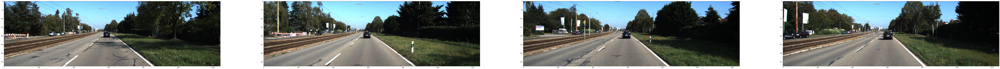

In [66]:
image_paths = sorted(glob.glob('data/0005/*.png'))
images = [cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB) for img_path in image_paths]

fig, ax = plt.subplots(1, 4, figsize=(150, 100))
for i in range(4):
    ax[i].imshow(images[i*20])

#### Get MSCOCO classes

In [47]:
fp = r'/content/drive/My Drive/yolov5/data/coco128.yaml'

with open(fp, "r") as stream:
    try:
        coco_info = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

# get classes dictionary
classes = {i : name for i, name in enumerate(coco_info['names'])}

### Helper functions

In [177]:
def id_to_color(idx):
    """
    Random function to convert an id to a color
    (keep numbers below 255)
    """
    blue = idx*5 % 256
    green = idx*12 %256
    red = idx*23 %256
    return (red, green, blue)

def draw_boxes(image_in, boxes, categories, mot_mode=False):
    image = image_in.copy()
    h, w, _ = image.shape
    for i, box in enumerate(boxes):
        label = classes[int(categories[i])]
        color = id_to_color(i*10) if mot_mode==True else (255,0,60)
        cv2.rectangle(image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), color, thickness=3)
        cv2.putText(image, str(label), (int(box[0]), int(box[1])), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=3)
    return image

def inference(img, boxes=True):
    results = model(img)
    predictions = results.pred[0]
    boxes = predictions[:, :4].tolist()
    boxes_int = [[int(v) for v in box] for box in boxes]
    scores = predictions[:,4].tolist()
    categories = predictions[:,5].tolist()
    categories_int = [int(c) for c in categories]
    
    if boxes:
        img_out = draw_boxes(img, boxes_int, categories_int, mot_mode=False)
    else:
        img_out = img.copy()

    # change everything to arrays
    # boxes_int = np.array(boxes_int)
    # categories_int = np.array(categories_int)
    # scores = np.array(scores)
    return img_out, boxes_int, categories_int, scores

### Get bounding boxes for video file

In [ ]:
# video_path = 'data/cars.mp4'
# output_images = []


# cap = cv2.VideoCapture(video_path)

# while True:
#     # get frames form video
#     ret, frame = cap.read()

#     if not ret:
#         print('Frame not recieved, exiting...')
#         break

#     frame = cv2.resize(frame, (960, 540), cv2.INTER_AREA)
#     frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#     img_out, boxes_int, categories_int, scores = inference(frame, draw_boxes=True)

#     output_images.append(img_out)

# cap.release()
# cv2.destroyAllWindows()

Frame not recieved, exiting...


### Get bounding boxes on dataset

In [69]:
detections = []

for img in images:
    img_out, boxes_int, categories_int, scores = inference(img, boxes=True)
    detections.append(img_out)

In [77]:
img_out.shape

(375, 1242, 3)

### Get Video of detections

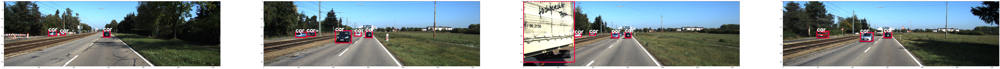

In [70]:
fig, ax = plt.subplots(1, 4, figsize=(150, 100))
for i in range(4):
    ax[i].imshow(detections[-i*20])

In [71]:
from tqdm import tqdm

detection_video = [img for img in tqdm(detections)]

out = cv2.VideoWriter('data/car_detections.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 15, (img_out.shape[1],img_out.shape[0]))

for img in detection_video:
    out.write(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
out.release()

100%|██████████| 297/297 [00:00<00:00, 631377.74it/s]


### Implement Box IOU Loss functions

For the loss function, we will combine the traditional bounding box Intersection over Union (IOU) along with 2 other metrics, Sanchez Matilla and Yu loss to form a total loss metric.

More info can be found in this [paper](https://arxiv.org/pdf/1709.03572.pdf) on pages 10-11.

The IOU Loss compares how close to boxes are to eachother however it scores no overlap for 2 boxes within close proximity the same as 2 that are far away, hence it is not the best measure of distance.

The Sanchez-Matilla Loss combines a normalized measure of box center distance along with box shape (aspect). This is an effective measure of position and shape (aspect).

The Yu Loss provides an exponential measure of distance and shape (aspect) and has the benefit of constraining the loss to [0, 1], where 0 indicates no similarity and 1 indicates complete similarity



In [79]:
def box_iou(box1, box2, w=1242, h=375):
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    inter_area = max(0, xB - xA + 1) * max(0, yB - yA + 1) 
    # Calculate the Union area by using Formula: Union(A,B) = A + B - Inter(A,B)
    box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1) 
    box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1) 
    union_area = (box1_area + box2_area) - inter_area
    # compute the IoU
    iou = inter_area/float(union_area)
    return iou


def check_division_by_0(value, epsilon=0.01):
    if value < epsilon:
        value = epsilon
    return value


def sanchez_matilla(box1, box2, w=1242, h=375):
    Q_dist = np.sqrt(pow(w,2)+pow(h,2)) # First real-life Pythagore use in your life
    Q_shape = w*h
    distance_term = Q_dist/check_division_by_0(np.sqrt(pow(box1[0] - box2[0], 2)+pow(box1[1] -box2[1],2)))
    shape_term = Q_shape/check_division_by_0(np.sqrt(pow(box1[2] - box2[2], 2)+pow(box1[3] - box2[3],2)))
    linear_cost = distance_term*shape_term
    return linear_cost


def yu(box1, box2):
    w1 = 0.5
    w2 = 1.5
    a= (box1[0] - box2[0])/check_division_by_0(box1[2])
    a_2 = pow(a,2)
    b = (box1[1] - box2[1])/check_division_by_0(box1[3])
    b_2 = pow(b,2)
    ab = (a_2+b_2)*w1*(-1)
    c = abs(box1[3] - box2[3])/(box1[3]+box2[3])
    d = abs(box1[2]-box2[2])/(box1[2]+box2[2])
    cd = (c+d)*w2*(-1)
    exponential_cost = np.exp(ab)*np.exp(cd)
    return exponential_cost

For the total cost, we only check that Each cost metric exceeds a predefined threshold, then we output the iou_cost if the threshold conditions are satisfied. For this cost function, a higher cost indicates a greater similarity.

In [76]:
def total_cost(old_box, new_box, iou_thresh=0.3, linear_thresh=10000, exp_thresh=0.5):
    iou_cost = box_iou(old_box, new_box, w=1280, h=360)
    linear_cost = sanchez_matilla(old_box, new_box, w=1280, h=360)
    exp_cost = yu(old_box, new_box)

    if (iou_cost >= iou_thresh) \
          and (linear_cost >= linear_thresh) \
          and (exp_cost >= exp_thresh):
      return iou_cost
    else:
      return 0


### Implement the Hungarian Algorithm

The Hungarian Algorithm allows for matching closely related objects (determined via total loss) across different frames. If a newly detected object is not matched across frames, the it will be declared as a new track, and if a track does not have a new match after a given number of frames then it will be deleted as a track.

In this implementation we will use a Kalman Filter to track the bounding box center of each track. This has 2 major benefits:

-  It gives the Hungarian Algorithm a better chance of mathing tracks from frame to frame, since the new bounding boxes are morely likely to overlap with the predicted ones from the Kalman Filter

- It will maintain a bounding box position on each track. This in turn helps the Algorithm maintain track through occlusion or dropped detections, both of which are a major problem in Multiple Object Tracking (MOT)

In [106]:
from scipy.optimize import linear_sum_assignment

def associate(old_boxes, new_boxes):
    """
    old_boxes will represent the former bounding boxes (at time 0)
    new_boxes will represent the new bounding boxes (at time 1)
    Function goal: Define a Hungarian Matrix with IOU as a metric and return, for each box, an id
    """
    if (len(new_boxes) == 0) and (len(old_boxes) == 0):
        return [], [], []
    elif(len(old_boxes)==0):
        return [], new_boxes, []
    elif(len(new_boxes)==0):
        return [], [], old_boxes

    # Define a new IOU Matrix nxm with old and new boxes
    iou_matrix = np.zeros((len(old_boxes),len(new_boxes)),dtype=np.float32)

    # Go through boxes and store the IOU value for each box 
    # You can also use the more challenging cost but still use IOU as a reference for convenience (use as a filter only)
    for i,old_box in enumerate(old_boxes):
        for j,new_box in enumerate(new_boxes):
            iou_matrix[i][j] = total_cost(old_box, new_box)
    
    # Call for the Hungarian Algorithm
    hungarian_row, hungarian_col = linear_sum_assignment(-iou_matrix)
    hungarian_matrix = np.array(list(zip(hungarian_row, hungarian_col)))

    # TEMP
    # print(hungarian_row)
    # print(hungarian_col)

    # Create new unmatched lists for old and new boxes
    matches, unmatched_detections, unmatched_trackers = [], [], []

    # Go through the Hungarian Matrix, if matched element has IOU < threshold (0.3), add it to the unmatched 
    # Else: add the match    
    for h in hungarian_matrix:
        if(iou_matrix[h[0],h[1]]<0.3):
            unmatched_trackers.append(old_boxes[h[0]])
            unmatched_detections.append(new_boxes[h[1]])
        else:
            matches.append(h.reshape(1,2))
    
    if(len(matches)==0):
        matches = np.empty((0,2),dtype=int)
    else:
        matches = np.concatenate(matches,axis=0)
    
    # Go through old boxes, if no matched detection, add it to the unmatched_old_boxes
    for t,trk in enumerate(old_boxes):
	    if(t not in hungarian_matrix[:,0]):
		    unmatched_trackers.append(trk)
    
    # Go through new boxes, if no matched tracking, add it to the unmatched_new_boxes
    for d, det in enumerate(new_boxes):
        if(d not in hungarian_matrix[:,1]):
                unmatched_detections.append(det)
    
    return matches, unmatched_detections, unmatched_trackers

#### Lets dig into an example with Hungarian Algorithm to get a better feel for how it works

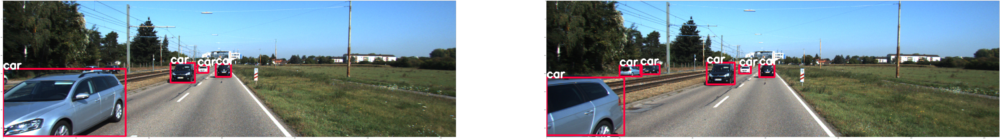

In [111]:
_, ax = plt.subplots(1, 2, figsize=(200, 100))
ax[0].imshow(detections[-22])
ax[1].imshow(detections[-21])

In [101]:
_, boxes_1, _, _ = inference(images[-22], boxes=True)
_, boxes_2, _, _ = inference(images[-21], boxes=True)

In [102]:
print(boxes_1)
print(boxes_2)

[[  0 187 336 373]
 [459 171 526 225]
 [583 174 625 209]
 [533 177 563 198]]
[[  0 211 213 370]
 [583 175 625 210]
 [200 178 261 208]
 [528 177 560 200]
 [439 170 516 230]
 [257 175 310 202]]


In [105]:
# print Hungarian row and column
matches, unmatched_detections, unmatched_trackers = associate(boxes_1, boxes_2)

[0 1 2 3]
[0 4 1 3]


matches shows the original boxes on the left and compares them to their new matches on the right

In [107]:
matches

array([[0, 0],
       [1, 4],
       [2, 1],
       [3, 3]])

We can see that we have 2 new observations and no unmatched tracks, and this corresponds to the images above where 2 new cars are detected in upper left portion of the image.

In [108]:
unmatched_detections

[array([200, 178, 261, 208]), array([257, 175, 310, 202])]

In [109]:
unmatched_trackers

[]

### Obstacles

In order to track obstacles, we will define an obstacle class

In [113]:
MIN_HIT_STREAK = 2 # Number of matches required before considering an obstacle
MAX_UNMATCHED_AGE = 2 # Number of unmatches required before considering a lost track

In [114]:
class Obstacle():
    def __init__(self, idx, box, cat, age=1, unmatched_age=0):
        self.idx = idx
        self.box = box
        self.cat = cat
        self.age = age
        self.unmatched_age = unmatched_age

In [138]:
# cat = categories[out_boxes.index(new_obs)]
# cat = categories[out_boxes[out_boxes == new_obs]]

a = [0,5,1,3,7,70,180,188]
arr = np.array(a)
print(a.index(7))
print(np.where(arr == 7)[0][0])
print(arr[arr == 7][0])

4
4
7


In [152]:
a = np.array([[255, 172, 302, 199],
     [570, 171, 609, 207],
     [321, 179, 352, 195]])
idx = np.array([255, 172, 302, 199])

np.where(np.sum(a == idx, 1) == 4)

(array([0]),)

In [163]:
np.where(a == idx)[0][0]

0

In [162]:
np.asarray(a == [idx]).nonzero()[0][0]

0

In [178]:
def main(input_image):
      global stored_obstacles
      global idx

      # 1 — Run Obstacle Detection & Convert the Boxes
      final_image = input_image.copy()
      h, w, _ = final_image.shape
      _, out_boxes, categories, _ = inference(input_image)

      #print("----> New Detections: ", out_boxes)

      # Define the list we'll return:
      new_obstacles = []

      old_obstacles = [obs.box for obs in stored_obstacles] # Simply get the boxes
      matches, unmatched_detections, unmatched_tracks = associate(old_obstacles, out_boxes) # Associate the obstacles
              
      # Matching
      for match in matches:
          # obs = Obstacle(stored_obstacles[match[0]].idx, 
          #                out_boxes[match[1]],
          #                stored_obstacles[match[0]].cat,
          #                stored_obstacles[match[0]].age + 1,
          #                stored_obstacles[match[0]].unmatched_age)

          # get matched obstacle and update bounding box and age
          obs = stored_obstacles[match[0]]
          obs.box = out_boxes[match[1]]
          obs.age += 1

          new_obstacles.append(obs)
          #print("Obstacle ", obs.idx, " with box: ", obs.box, "has been matched with obstacle ", stored_obstacles[match[0]].box, "and now has age: ", obs.age)
      
      # New (Unmatched) Detections
      for new_obs in unmatched_detections:

          cat = categories[out_boxes.index(new_obs)]
          # cat = categories[np.where(out_boxes == new_obs)[0][0]] # only if using arrays
          obs = Obstacle(idx, new_obs, cat, age=0, unmatched_age=0)
          new_obstacles.append(obs)
          idx+=1
          #print("Obstacle ", obs.idx, " has been detected for the first time: ", obs.box)

      # Unmatched Tracking: NO RE-IDENTIFICATION FOR NOW
      for old_track in unmatched_tracks:
              #print("Obstacle ", obs.idx, "is a long term obstacle unmatched ", obs.unmatched_age, "times.")

          # get unmatched obstacle in stored_obstacles

          # old_obs = stored_obstacles[old_obstacles.index(old_track)]
          # obs = Obstacle(old_obs.idx, 
          #                old_obs.box,
          #                old_obs.cat,
          #                old_obs.age,
          #                old_obs.unmatched_age + 1)

          obs = stored_obstacles[old_obstacles.index(old_track)]
          obs.unmatched_age += 1
          new_obstacles.append(obs)

      # Draw the Boxes
      for i, obs in enumerate(new_obstacles):
          if obs.unmatched_age > MAX_UNMATCHED_AGE:
              new_obstacles.remove(obs)

          if obs.age >= MIN_HIT_STREAK:
              left, top, right, bottom = obs.box
              label = str(classes[int(obs.cat)] + '_' + str(obs.idx))
              cv2.rectangle(final_image, (left, top), (right, bottom), id_to_color(obs.idx*10), thickness=7)
              final_image = cv2.putText(final_image, label,(left - 10,top - 10),cv2.FONT_HERSHEY_SIMPLEX, 1,id_to_color(obs.idx*10),thickness=4)

      stored_obstacles = new_obstacles

      return final_image, stored_obstacles

Run the main tracking loop with no Kalman Filtering

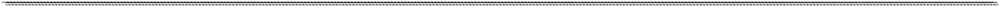

In [179]:
fig=plt.figure(figsize=(100,100))
out_imgs = []
stored_obstacles = []
idx = 0

for i in range(len(images)):
    out_img, stored_obstacles = main(images[i])
    out_imgs.append(out_img)
    fig.add_subplot(1, len(images), i+1)
    plt.imshow(out_imgs[i])

plt.show()

In [187]:
import time

track_vid_1 = []
idx = 0
stored_obstacles = []

# get time stamps to compute Kalman Filter delta_t
TIME_STAMPS = []

for img in tqdm(images):
    out_img, stored_obstacles = main(img)
    track_vid_1.append(out_img)
    TIME_STAMPS.append(time.time())

100%|██████████| 297/297 [00:49<00:00,  6.00it/s]


In [184]:
out = cv2.VideoWriter('data/track_vid_1.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 15, (out_img.shape[1],out_img.shape[0]))

for img in track_vid_1:
    out.write(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
out.release()

Looking at the result video, we can see that we loose track of the car in front even though it is not occluded by anything. This is because the detector is not able to detect the car on every frame. We can tune the detector to be more sensitive or we can extrapolate the locations of unmatched detections between frames. We will implement the latter option with a Kalman Filter.

### Implement Kalman Filter

We will use a constant velocity model to model the motion on the objects across frames. For this case we will only track the bounding box centers, and assume that the box width and height are the same as the most recently measured box

In [ ]:
!pip install filterpy

In [186]:
from filterpy.kalman import KalmanFilter
from scipy.linalg import block_diag
from filterpy.common import Q_discrete_white_noise

def constantVelocity_KF(R_std, Q_std, dt, w, h):
    ''' creates and instantiates a filterpy 2D Kalman Filter object
        with a 2D constant acceleration model
        Inputs:
            R_Std (float) - measurement uncertainty
            Q_std (float) - Proccess noise covariance
            dt (float) - System Time Step
            w (int) - Frame Width
            h (int) - Frame Height
        Outputs:
            kf (filterpy object) 2D Kalman Filter object
    '''
    kf = KalmanFilter(dim_x=4, dim_z=2)
    kf.x = np.array([w//2, 0.1, h//2, 0.1]) # initial state (center of frame)
    kf.P = np.eye(4)*np.max([w//2, h//2])
    q = Q_discrete_white_noise(dim=2, dt=dt, var=Q_std**2)
    kf.Q = block_diag(q, q) # Process noise covariance
    kf.R = np.eye(2) * R_std**2 # measurement uncertainty/noise
    kf.H = np.array([[1, 0, 0, 0],  # measurement function
                     [0, 0, 1, 0]])
    
    kf.F = np.array([[1, dt, 0, 0],     # state transition matrix
                     [0, 1,  0, 0],
                     [0, 0,  1, dt],
                     [0, 0,  0, 1]])

    return kf

In [190]:
# define measurement noise std dev and process noise std dev
R_std_v = 7.5 # measurement uncertainty
Q_std_v = 0.85 #  process noise
dt_v = np.mean(np.diff(TIME_STAMPS)) # time delta

# frame width and height
w, h = 1242, 375

# initialize Kalman Filters
const_vel_kf = constantVelocity_KF(R_std_v, Q_std_v, dt_v, w, h)

### New Obstacle class
We will redefine the obstacles class to have it contain the predicted state(Kalman Filter estimate) of each track

In [192]:
MIN_HIT_STREAK = 2 # Number of matches required before considering an obstacle
MAX_UNMATCHED_AGE = 2 # Number of unmatches required before considering a lost track

In [193]:
class Obstacle():
    def __init__(self, idx, box, kf, cat, age=1, unmatched_age=0):
        self.idx = idx
        self.box = box
        self.kf = kf # add Kalman Filter as a class object
        self.cat = cat
        self.age = age
        self.unmatched_age = unmatched_age

Redfine main to include the Kalman Filter

In [ ]:
def main_2(input_image):
      global stored_obstacles
      global idx

      # 1 — Run Obstacle Detection & Convert the Boxes
      final_image = input_image.copy()
      h, w, _ = final_image.shape
      _, out_boxes, categories, _ = inference(input_image)

      #print("----> New Detections: ", out_boxes)

      # Define the list we'll return:
      new_obstacles = []

      old_obstacles = [obs.box for obs in stored_obstacles] # Simply get the boxes
      matches, unmatched_detections, unmatched_tracks = associate(old_obstacles, out_boxes) # Associate the obstacles
              
      # Matching
      for match in matches:
          # obs = Obstacle(stored_obstacles[match[0]].idx, 
          #                out_boxes[match[1]],
          #                stored_obstacles[match[0]].cat,
          #                stored_obstacles[match[0]].age + 1,
          #                stored_obstacles[match[0]].unmatched_age)

          # get matched obstacle and update bounding box and age
          obs = stored_obstacles[match[0]]
          obs.box = out_boxes[match[1]]
          obs.age += 1

          new_obstacles.append(obs)
          #print("Obstacle ", obs.idx, " with box: ", obs.box, "has been matched with obstacle ", stored_obstacles[match[0]].box, "and now has age: ", obs.age)
      
      # New (Unmatched) Detections
      for new_obs in unmatched_detections:

          cat = categories[out_boxes.index(new_obs)]
          # cat = categories[np.where(out_boxes == new_obs)[0][0]] # only if using arrays
          obs = Obstacle(idx, new_obs, const_vel_kf, cat, age=0, unmatched_age=0)
          new_obstacles.append(obs)
          idx+=1
          #print("Obstacle ", obs.idx, " has been detected for the first time: ", obs.box)

      # Unmatched Tracking: NO RE-IDENTIFICATION FOR NOW
      for old_track in unmatched_tracks:
              #print("Obstacle ", obs.idx, "is a long term obstacle unmatched ", obs.unmatched_age, "times.")

          # get unmatched obstacle in stored_obstacles

          # old_obs = stored_obstacles[old_obstacles.index(old_track)]
          # obs = Obstacle(old_obs.idx, 
          #                old_obs.box,
          #                old_obs.cat,
          #                old_obs.age,
          #                old_obs.unmatched_age + 1)

          obs = stored_obstacles[old_obstacles.index(old_track)]
          obs.unmatched_age += 1
          new_obstacles.append(obs)

      # Draw the Boxes
      for i, obs in enumerate(new_obstacles):
          if obs.unmatched_age > MAX_UNMATCHED_AGE:
              new_obstacles.remove(obs)

          if obs.age >= MIN_HIT_STREAK:
              left, top, right, bottom = obs.box
              label = str(classes[int(obs.cat)] + '_' + str(obs.idx))
              cv2.rectangle(final_image, (left, top), (right, bottom), id_to_color(obs.idx*10), thickness=7)
              final_image = cv2.putText(final_image, label,(left - 10,top - 10),cv2.FONT_HERSHEY_SIMPLEX, 1,id_to_color(obs.idx*10),thickness=4)

      stored_obstacles = new_obstacles

      return final_image, stored_obstacles